In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision as tv
from PIL import Image
from pytorch_lightning import Trainer
from torch.nn import functional as F
from torchvision.utils import make_grid

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from dhdrnet.model import (
    DHDRMobileNet_v1,
    DHDRMobileNet_v2,
    DHDRMobileNet_v3,
    DHDRSimple,
    DHDRSqueezeNet,
)
from dhdrnet.resnet_model import DHDRResnet
from dhdrnet.histogram_model import HistogramNet
from dhdrnet.util import DATA_DIR, ROOT_DIR

figdir = ROOT_DIR / "figures"
plt.rcParams["figure.figsize"] = (10, 10)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu") 
gpus = "0" if torch.cuda.is_available() else None

def show(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)), interpolation="nearest")
    plt.show()

In [3]:
from IPython.utils import io
def get_best_model(model_cls, backbone:str):
    
    with io.capture_output(stdout=True,stderr=True) as _captured:
        trainer = Trainer(gpus=gpus, progress_bar_refresh_rate=0)
        test_scores = dict()
        for ckpt in (ROOT_DIR / "checkpoints").glob(f"*{backbone}*"):
            model = model_cls.load_from_checkpoint(
                checkpoint_path=str(ckpt)
            )
            model.eval()

            test_score = trainer.test(model)["test_loss"]
            test_scores[str(ckpt.stem)] = test_score, model
    
    best_model = min(test_scores.values(),key=lambda x:x[0])
    return best_model

In [4]:
resnet_score, resnet_model = get_best_model(DHDRResnet, "resnet")
print(resnet_score)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


1.550647497177124


In [5]:
print(resnet_score)
best_model = resnet_model

1.550647497177124


In [6]:
image_names = pd.read_csv(ROOT_DIR / "test.txt", header=None).sample(n=9)[0]

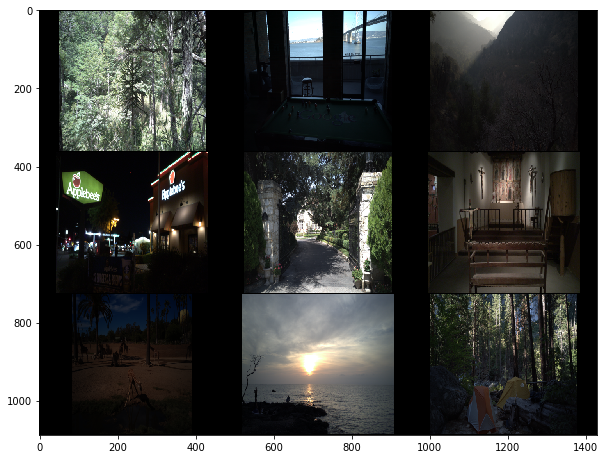

In [7]:
input_images = [
    Image.open(DATA_DIR / "correct_exposures" / "exposures" / f"{name}[0.0].png")
    for name in image_names
]

transforms = tv.transforms.Compose(
    [
        tv.transforms.CenterCrop((360, 474)),  # min dimensions along DS
        tv.transforms.ToTensor(),
    ]
)
image_tensors = torch.stack([transforms(im) for im in input_images])
show(make_grid(image_tensors, nrow=3))

In [8]:
from dhdrnet.Dataset import LUTDataset
from torch.utils.data import DataLoader
from torchvision.transforms import (
    Compose,
    Resize,
    ToTensor,
)
test_data = LUTDataset(
    df=pd.read_csv(ROOT_DIR / "precomputed_data" / "store_current.csv"),
    exposure_path=DATA_DIR / "correct_exposures" / "exposures",
    raw_dir=DATA_DIR / "dngs",
    name_list=ROOT_DIR / "precomputed_data" / "test_current.csv",
    transform=Compose([ Resize((300, 300)), ToTensor()])
)

test_loader = DataLoader(
    test_data, batch_size=80, pin_memory=True, num_workers=8
)

In [26]:
ev_options = np.arange(-3, 6.25, 0.25)

def get_preds(model, input):
    in_image, label, name = input
    outputs = F.softmax(model(in_image.to(device)), dim=1)
    _, predictions = torch.max(outputs, 1)
    predictions = predictions.to("cpu")
    return zip(predictions.numpy(), label.numpy())


# predictions = ev_options[get_preds(best_model, image_tensors)]
# print(f"{predictions=}")

/home/shane/.cache/pypoetry/virtualenvs/dhdrnet-md5k9ngR-py3.8/lib/python3.8/site-packages/colour/utilities/verbose.py:235: ColourWarning: "Adobe DNG Converter" is not available on your platform!
  warn(*args, **kwargs)


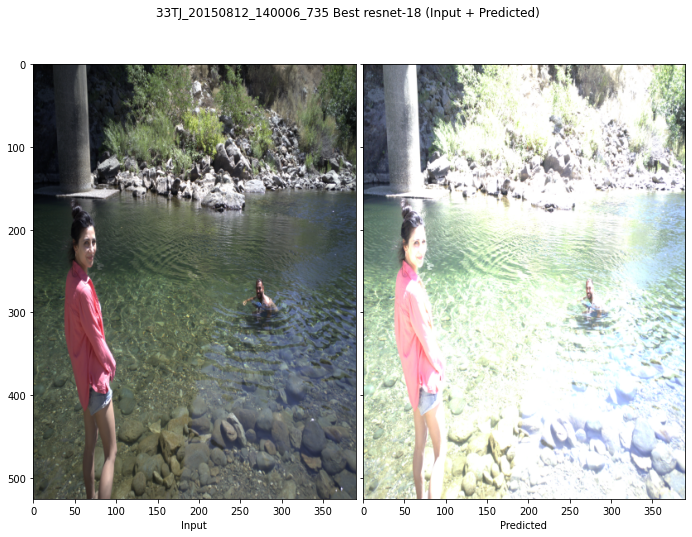

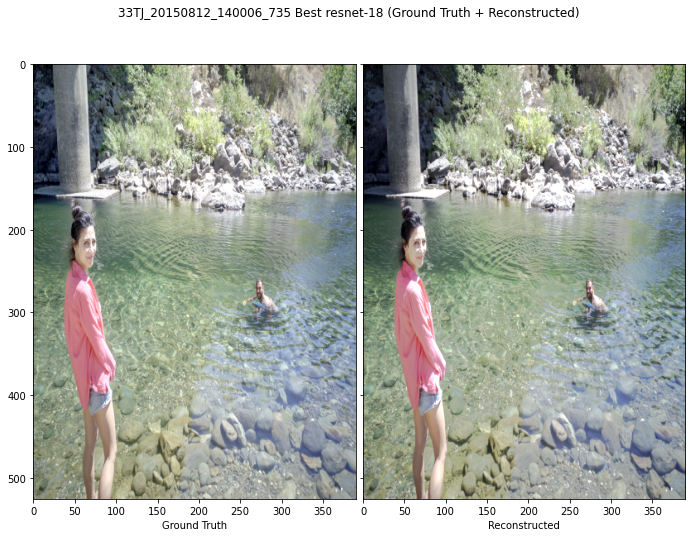

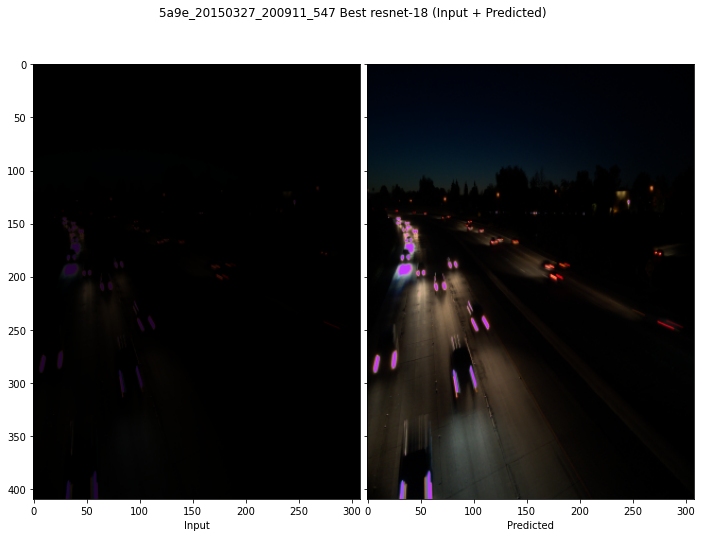

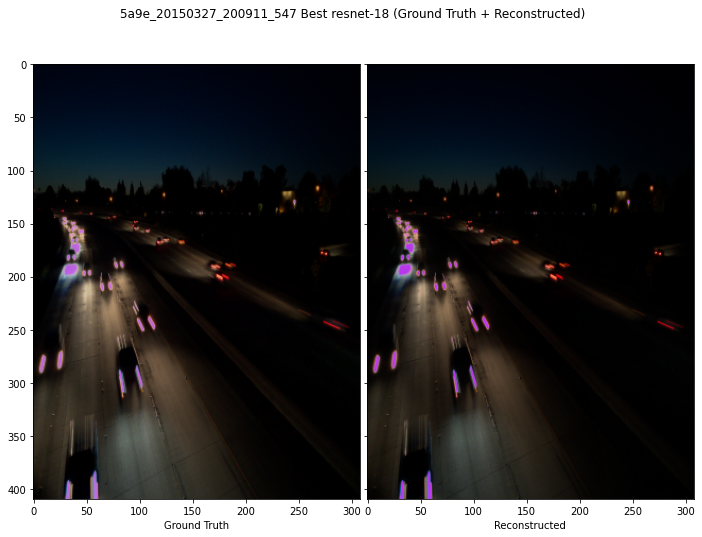

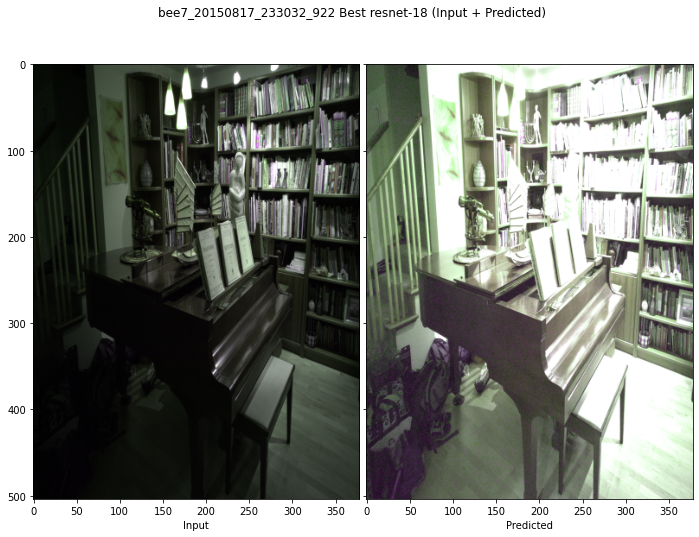

...

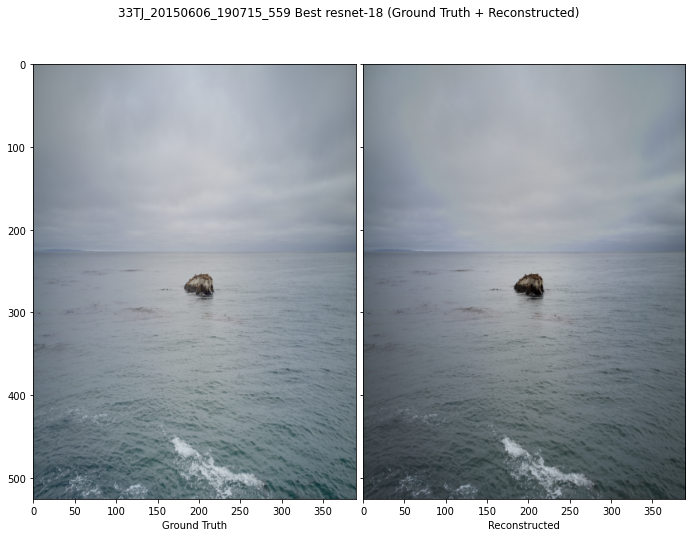

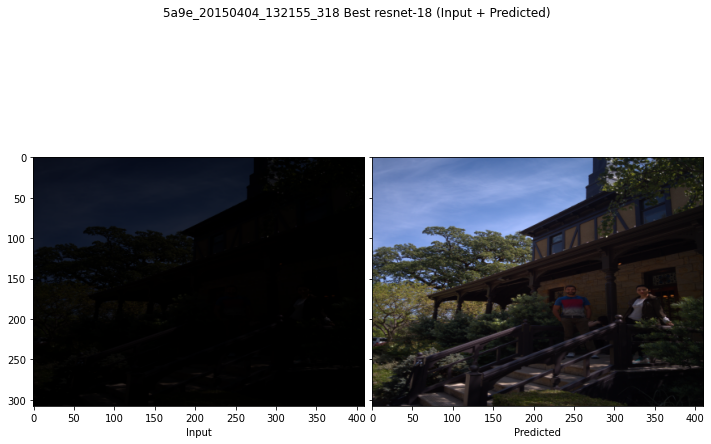

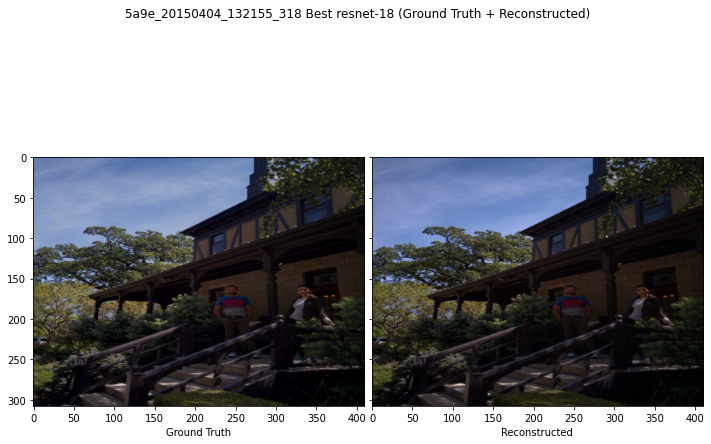

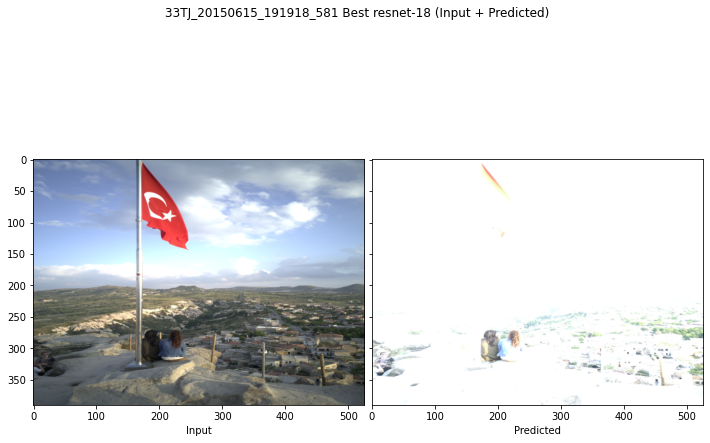

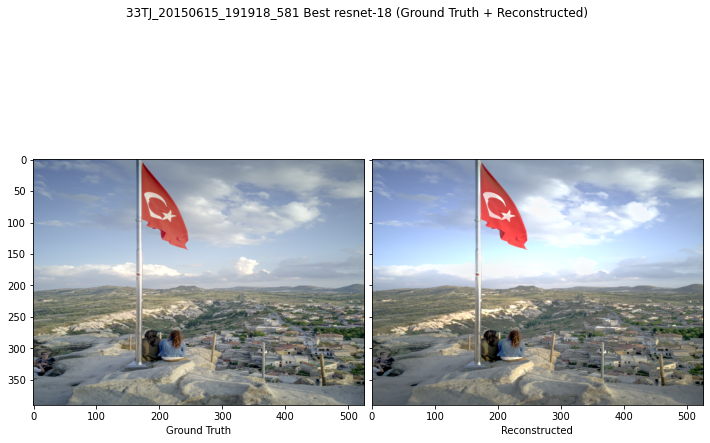

In [9]:
from dhdrnet.vis_util import show_image_pair, show_predictions

show_predictions(predictions, "Best resnet-18", image_names, ev_options)

In [36]:
from more_itertools import flatten
y_pred, y_true = list(zip(*flatten([get_preds(best_model, batch) for batch in test_loader])))

In [37]:
list(zip(y_pred,y_true))

[(25, 24),
 (27, 26),
 (27, 27),
 (25, 25),
 (9, 35),
 (23, 23),
 (26, 26),
 (24, 24),
 (27, 26),
 (27, 26),
 (23, 21),
 (27, 26),
 (23, 22),
 (27, 25),
 (28, 27),
 (9, 10),
 (23, 23),
 (23, 22),
 (4, 0),
 (8, 8),
 (29, 29),
 (25, 24),
 (27, 27),
 (26, 25),
 (32, 31),
 (25, 24),
 (28, 28),
 (28, 28),
 (30, 31),
 (28, 27),
 (29, 29),
 (24, 24),
 (26, 24),
 (28, 28),
 (30, 29),
 (32, 9),
 (28, 26),
 (28, 27),
 (28, 27),
 (29, 29),
 (29, 29),
 (28, 28),
 (27, 26),
 (27, 28),
 (29, 29),
 (26, 24),
 (24, 23),
 (29, 28),
 (29, 30),
 (30, 30),
 (29, 29),
 (30, 29),
 (29, 29),
 (30, 29),
 (25, 24),
 (25, 23),
 (27, 26),
 (29, 30),
 (28, 27),
 (28, 26),
 (27, 27),
 (29, 29),
 (29, 29),
 (30, 29),
 (27, 28),
 (27, 26),
 (26, 27),
 (28, 28),
 (24, 24),
 (26, 27),
 (25, 24),
 (26, 25),
 (23, 21),
 (24, 23),
 (9, 11),
 (28, 27),
 (27, 26),
 (27, 26),
 (24, 18),
 (27, 25),
 (27, 26),
 (4, 0),
 (6, 7),
 (27, 29),
 (27, 27),
 (27, 28),
 (26, 25),
 (0, 4),
 (31, 28),
 (25, 23),
 (23, 27),
 (23, 27),
 (

In [64]:
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score, 
    explained_variance_score,
    balanced_accuracy_score,
    multilabel_confusion_matrix,
    f1_score
)

print(f"{explained_variance_score(y_true, y_pred)=}")
print(f"{mean_absolute_error(y_true, y_pred)=}")
print(f"{mean_squared_error(y_true, y_pred)=}")
print(f"{r2_score(y_true, y_pred)=}")
print(f"{f1_score(y_true, y_pred, average='micro')=}")
print(f"{balanced_accuracy_score(y_true, y_pred,adjusted=False)=}")
# print(f"{multilabel_confusion_matrix(y_true, y_pred)=}")

explained_variance_score(y_true, y_pred)=0.5470212369107327
mean_absolute_error(y_true, y_pred)=1.8370165745856353
mean_squared_error(y_true, y_pred)=18.560773480662984
r2_score(y_true, y_pred)=0.5361273886613656
f1_score(y_true, y_pred, average='micro')=0.3370165745856354
balanced_accuracy_score(y_true, y_pred,adjusted=False)=0.12711043499877753
